<a href="https://colab.research.google.com/github/dimna21/ML_Final_Project/blob/main/model_experiment_NBEATS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install neuralforecast
import pandas as pd
import numpy as np
features = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/features.csv')
stores = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/stores.csv')
train = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/train.csv')
test = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/test.csv')
features.columns, stores.columns, train.columns, test.columns

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 MB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━

(Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
        'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
        'IsHoliday'],
       dtype='object'),
 Index(['Store', 'Type', 'Size'], dtype='object'),
 Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object'),
 Index(['Store', 'Dept', 'Date', 'IsHoliday'], dtype='object'))

# wandb setup

In [ ]:
!pip install wandb
import wandb
wandb.login()
WANDB_API_KEY  = 'f8a227b42dc881e037b25911fa86b8a491fc0581'

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: nkhar21 (nkhar21-student) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


# preprocessor

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class Preprocessor(BaseEstimator, TransformerMixin):
    """
    Turns train/test tables into [unique_id, ds, y, IsHoliday] for NeuralForecast N-BEATS.
    Uses only Store, Dept, Date, Weekly_Sales (or zeros if missing).
    Drops all exogenous features.
    """
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        df = X.copy()
        # parse dates
        df['Date'] = pd.to_datetime(df['Date'])
        # set y: use Weekly_Sales if present, else zeros
        if 'Weekly_Sales' in df.columns:
            df['y'] = df['Weekly_Sales']
        else:
            df['y'] = 0.0
        # build a unique series ID per Store-Dept
        df['unique_id'] = df['Dept'].astype(str) + '_' + df['Store'].astype(str)
        # rename for NeuralForecast
        df = df.rename(columns={'Date': 'ds'})
        # select only the needed columns
        return df[['unique_id', 'ds', 'y', 'IsHoliday']]


# date splitter

In [ ]:
import pandas as pd

def split_sales_data(df: pd.DataFrame, split_date : pd.Timestamp = pd.Timestamp('2012-02-15')):
    """
    Splits sales data into train and test sets based on a provided date,
    including the 'Weekly_Sales' column in both dataframes.

    Parameters:
    - df (pd.DataFrame): df to be split.
    - split_date (pd.Timestamp): The cutoff date for train-test split.

    Returns:
    - df_train, df_test: Tuple of training and test dataframes including 'Weekly_Sales'.
    """
    # Ensure Date is in datetime format
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])

    # Split the data based on date
    train_mask = df['Date'] < split_date
    test_mask = df['Date'] >= split_date

    df_train = df[train_mask].copy()
    df_test = df[test_mask].copy()

    return df_train, df_test


# preprocees and split for training

In [ ]:
train_df, val_df = split_sales_data(train)

preprocessor = Preprocessor()
train_df = preprocessor.fit_transform(train_df)
val_df = preprocessor.transform(val_df)

w_train = train_df["IsHoliday"].map({True: 5, False: 1}).values
w_val = val_df["IsHoliday"].map({True: 5, False: 1}).values
train_df = train_df.drop('IsHoliday', axis=1)
val_df = val_df.drop('IsHoliday', axis=1)

X_train = train_df.drop('y', axis=1)
y_train = train_df['y']
X_val = val_df.drop('y', axis=1)
y_val = val_df['y']
train_df.shape, train_df.columns, val_df.shape, val_df.columns

((311960, 3),
 Index(['unique_id', 'ds', 'y'], dtype='object'),
 (109610, 3),
 Index(['unique_id', 'ds', 'y'], dtype='object'))

# helper fucntions for training

In [ ]:
import torch
import pandas as pd
import wandb
from neuralforecast.models import NBEATS
from neuralforecast import NeuralForecast
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

# Your W&B‑adapted helpers from before:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


def evaluate_and_plot(model, X, y_true, w, split):
    """
    1) Predict & compute metrics (WMAE, MAE, RMSE, R2)
    2) Log metrics and diagnostic plots to W&B.
    """
    # 1) get the raw predictions DataFrame
    preds_df = model.predict(X)

    # 2) extract the forecast column (it's the last one)
    y_pred = preds_df.iloc[:, -1].to_numpy()

    # now y_true, y_pred, w are all 1-d numeric arrays
    # Compute metrics
    metrics = {
        "WMAE": wmae(y_true, y_pred, w),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "R2": r2_score(y_true, y_pred),
    }
    wandb.log({f"{split}_{m}": v for m, v in metrics.items()})
    print(f"[{split.upper()}] " + "  ".join(f"{k}={v:.4f}" for k,v in metrics.items()))

    # Plot 1: Actual vs Predicted
    fig, ax = plt.subplots(figsize=(6,6))
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.any():
        ax.scatter(y_true[mask], y_pred[mask], alpha=0.3, s=10)
        mn, mx = y_true[mask].min(), y_true[mask].max()
        ax.plot([mn,mx], [mn,mx], 'r--', linewidth=1)
    ax.set_xlabel("Actual Weekly Sales")
    ax.set_ylabel("Predicted Weekly Sales")
    ax.set_title(f"{split.capitalize()} Actual vs Predicted")
    wandb.log({f"{split}_actual_vs_pred": wandb.Image(fig)})
    plt.close(fig)

    # Plot 2: Residuals vs Predicted
    residuals = y_true - y_pred
    fig, ax = plt.subplots(figsize=(6,4))
    mask = np.isfinite(y_pred) & np.isfinite(residuals)
    if mask.any():
        ax.scatter(y_pred[mask], residuals[mask], alpha=0.3, s=10)
        ax.hlines(0, y_pred[mask].min(), y_pred[mask].max(),
                  colors='r', linestyles='--')
    ax.set_xlabel("Predicted Weekly Sales")
    ax.set_ylabel("Residuals (Actual – Pred)")
    ax.set_title(f"{split.capitalize()} Residuals vs Predicted")
    wandb.log({f"{split}_residuals": wandb.Image(fig)})
    plt.close(fig)

    # Plot 3: WMAE‑weighted error distribution
    fig, ax = plt.subplots(figsize=(6,4))
    mask = np.isfinite(y_true) & np.isfinite(y_pred) & np.isfinite(w)
    if mask.any():
        weighted_errors = w[mask] * np.abs(y_true[mask] - y_pred[mask])
        if weighted_errors.size:
            ax.hist(weighted_errors, bins=50, density=True, alpha=0.7)
            ax.set_xlabel("Weighted Absolute Error")
            ax.set_ylabel("Density")
            ax.set_title(f"{split.capitalize()} WMAE Error Dist.")
            wandb.log({f"{split}_wmae_error_dist": wandb.Image(fig)})
    plt.close(fig)

    return metrics


def plot_overfitting(train_metrics, val_metrics):
    """
    Plot bar chart comparing train vs val for each metric (WMAE, MAE, RMSE, R²)
    and log the figure to W&B.
    """
    metrics = list(train_metrics.keys())
    train_vals = [train_metrics[m] for m in metrics]
    val_vals   = [val_metrics[m]   for m in metrics]

    # Separate R2 from the rest for plotting on secondary axis
    primary_metrics = [m for m in metrics if m != "R2"]
    secondary_metrics = ["R2"]

    x_primary = np.arange(len(primary_metrics))
    x_secondary = [len(primary_metrics)]  # position for R2 on x-axis

    fig, ax1 = plt.subplots(figsize=(10, 5))
    # Primary metrics (WMAE, MAE, RMSE)
    train_primary = [train_metrics[m] for m in primary_metrics]
    val_primary   = [val_metrics[m]   for m in primary_metrics]
    ax1.bar(x_primary - 0.2, train_primary, width=0.4, label='Train', color='skyblue')
    ax1.bar(x_primary + 0.2, val_primary,   width=0.4, label='Val',   color='orange')
    ax1.set_ylabel("Error Metrics")
    ax1.set_xticks(list(x_primary) + x_secondary)
    ax1.set_xticklabels(primary_metrics + secondary_metrics)
    ax1.legend(loc="upper left")

    # R² on secondary y-axis
    ax2 = ax1.twinx()
    train_r2 = train_metrics.get("R2")
    val_r2   = val_metrics.get("R2")
    if train_r2 is not None and val_r2 is not None:
        ax2.bar(x_secondary[0] - 0.2, [train_r2], width=0.4, label='Train R²', color='green')
        ax2.bar(x_secondary[0] + 0.2, [val_r2],   width=0.4, label='Val R²',   color='red')
        ax2.set_ylabel("R² Score")
        ax2.set_ylim(0, 1)

    # Combine legends
    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(handles1 + handles2, labels1 + labels2, loc='upper left')

    plt.title("Train vs Val Metrics (Primary & R²)")
    plt.tight_layout()
    # Log overfitting metrics figure to W&B
    wandb.log({"train_vs_val_metrics": wandb.Image(fig)})
    plt.close(fig)

def wmae(y_true, y_pred, w):
    """Weighted MAE (holidays count 5×) with NaN handling."""
    # Create mask for finite values
    mask = np.isfinite(y_true) & np.isfinite(y_pred) & np.isfinite(w)

    if not mask.any():
        print("⚠️ All values are NaN/infinite in WMAE calculation")
        return np.nan

    # Filter to finite values only
    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]
    w_clean = w[mask]

    if w_clean.sum() == 0:
        print("⚠️ Sum of weights is zero in WMAE calculation")
        return np.nan

    return (w_clean * np.abs(y_true_clean - y_pred_clean)).sum() / w_clean.sum()



# NBEATS model subclass

In [ ]:
# N-BEATS subclass
class N_Beats(NBEATS):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.optimizer = torch.optim.AdamW(self.parameters(), lr=1e-3)
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=10, gamma=0.9)
    def configure_optimizers(self):
        return {
            "optimizer": self.optimizer,
            "lr_scheduler": {
                "scheduler": self.scheduler,
                "interval": "epoch",
                "frequency": 1
            }
        }

# training 1 - test 1

In [ ]:
class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(self):
        device = "gpu" if torch.cuda.is_available() else "cpu"
        model = N_Beats(
            input_size=20, h=24, max_steps=1500, batch_size=64,
            stack_types=["identity","trend","seasonality"],
            n_blocks=[1,1,1], random_seed=42,
            accelerator=device, devices=1,
            logger=True, enable_progress_bar=True, enable_model_summary=True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")
    def fit(self, X, y=None):
        df = pd.DataFrame({"unique_id":X["unique_id"],"ds":X["ds"],"y":y.values})
        df.sort_values(["unique_id","ds"], inplace=True)
        self.nf.fit(df)
        return self
    def predict(self, X=None):
        real = pd.DataFrame({"unique_id":X["unique_id"],"ds":X["ds"],"y":X["y"]})
        preds = self.nf.predict()
        merged = real.merge(preds, on=["unique_id","ds"], how="left").fillna(0)
        return merged

In [ ]:
import wandb

# 1) Start a new W&B run
wandb.init(
    project="ML_Final",
    name="NBeats_test_1",
    config={
        "input_size": 20,
        "horizon": 24,
        "max_steps": 1500,
        "batch_size": 64,
        "stack_types": ["identity", "trend", "seasonality"],
        "n_blocks": [1, 1, 1],
        "optimizer": "AdamW",
        "lr_scheduler_step": 10,
        "lr_scheduler_gamma": 0.9
    },
    reinit=True
)

# 2) Instantiate and fit the model
model = NBEATSModel()
model.fit(X_train, y_train)


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
2.2 K     Non-trainable params
2.5 M     Total params
9.885     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.


NBEATSModel()

In [ ]:
# Pull out the trained estimator to get its loss_history
est = model.nf.models[0]

# Log final training + validation loss (if available)
try:
    wandb.log({
        "train_loss": est.loss_history["train"][-1],
        "val_loss":   est.loss_history["val"][-1]
    })
except Exception as e:
    print("⚠️ Could not log loss_history:", e)

train_metrics = evaluate_and_plot(model, X_train.assign(y=y_train), y_train.values, w_train, split="train")
val_metrics = evaluate_and_plot(model, X_val.assign(y=y_val), y_val.values, w_val, split="val")

plot_overfitting(train_metrics, val_metrics)

wandb.finish()


⚠️ Could not log loss_history: 'N_Beats' object has no attribute 'loss_history'


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

⚠️ All values are NaN/infinite in WMAE calculation
[TRAIN] WMAE=nan  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

⚠️ All values are NaN/infinite in WMAE calculation
[VAL] WMAE=nan  MAE=6956.1243  RMSE=16498.4446  R2=0.4417


train_MAE,▁
train_R2,▁
train_RMSE,▁
val_MAE,▁
val_R2,▁
val_RMSE,▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439
train_WMAE,nan
val_MAE,6956.12433


# training 2 - input size, horiozon 1

In [ ]:
# N-BEATS subclass
class N_Beats(NBEATS):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.optimizer = torch.optim.AdamW(self.parameters(), lr=1e-3)
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=10, gamma=0.9)
    def configure_optimizers(self):
        return {
            "optimizer": self.optimizer,
            "lr_scheduler": {
                "scheduler": self.scheduler,
                "interval": "epoch",
                "frequency": 1
            }
        }

In [ ]:
import pandas as pd
import torch
from sklearn.base import BaseEstimator, TransformerMixin
from neuralforecast import NeuralForecast

class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(self, input_size: int, h: int):
        device = "gpu" if torch.cuda.is_available() else "cpu"
        # instantiate your LightningModule with the given window & horizon
        model = N_Beats(
            input_size   = input_size,
            h            = h,
            max_steps    = 1500,
            batch_size   = 64,
            stack_types  = ["identity","trend","seasonality"],
            n_blocks     = [1,1,1],
            random_seed  = 42,
            accelerator  = device,
            devices      = 1,
            logger       = True,
            enable_progress_bar  = True,
            enable_model_summary = True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")

    def fit(self, X, y=None):
        df = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        pd.to_datetime(X["ds"]),
            "y":         y.values
        })
        df.sort_values(["unique_id","ds"], inplace=True)
        self.nf.fit(df)
        return self

    def predict(self, X=None):
        real  = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        X["ds"],
            "y":         X["y"]
        })
        preds = self.nf.predict()
        return real.merge(preds, on=["unique_id","ds"], how="left").fillna(0)


In [ ]:
import wandb

# your list of (input_size, horizon) pairs to try
iz_h = [
    (4,4), (8,4), (16,4), (52,4),
    (4,8), (8,8), (16,8), (52,8)
]

for input_size, h in iz_h:
    print("==================================================================")
    print(f"=========== input size = {input_size}, horizon = {h} =========== ")
    print("==================================================================")
    # 1) start a new run
    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_{input_size}in_{h}h",
        config={
            "input_size": input_size,
            "h":          h,
            "max_steps":  1500,
            "batch_size": 64,
            "stack_types": ["identity","trend","seasonality"],
            "n_blocks":   [1,1,1],
        },
        reinit=True
    )

    # 2) build & train
    model = NBEATSModel(input_size=input_size, h=h)
    model.fit(X_train, y_train)

    # 3) evaluate
    train_m = evaluate_and_plot(
        model,
        X_train.assign(y=y_train),
        y_train.values,
        w_train,
        split="train"
    )
    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    plot_overfitting(train_m, val_m)

    # 4) log a summary metric for easy comparison
    wandb.log({
        "val_WMAE": val_m["WMAE"],
        "val_MAE":  val_m["MAE"],
        "val_RMSE": val_m["RMSE"],
        "val_R2":   val_m["R2"]
    })

    # 5) finish
    run.finish()
    print(f"Done run input_size={input_size}, h={h} → val_WMAE={val_m['WMAE']:.2f}")


=========== input size = 4, horizon = 4 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
72        Non-trainable params
2.4 M     Total params
9.540     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=14498.2371  MAE=14303.7633  RMSE=25611.2681  R2=-0.3455


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=4, h=4 → val_WMAE=14498.24
=========== input size = 8, horizon = 4 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
108       Non-trainable params
2.4 M     Total params
9.573     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=14481.8686  MAE=14285.6231  RMSE=25612.8886  R2=-0.3456


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=8, h=4 → val_WMAE=14481.87
=========== input size = 16, horizon = 4 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
180       Non-trainable params
2.4 M     Total params
9.639     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=14453.6724  MAE=14254.3750  RMSE=25599.1775  R2=-0.3442


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=16, h=4 → val_WMAE=14453.67
=========== input size = 52, horizon = 4 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
504       Non-trainable params
2.5 M     Total params
9.935     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=14437.4609  MAE=14236.4089  RMSE=25595.1020  R2=-0.3438


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=4 → val_WMAE=14437.46
=========== input size = 4, horizon = 8 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
204       Non-trainable params
2.4 M     Total params
9.582     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=13200.3557  MAE=12865.4014  RMSE=24046.1006  R2=-0.1860


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=4, h=8 → val_WMAE=13200.36
=========== input size = 8, horizon = 8 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
272       Non-trainable params
2.4 M     Total params
9.615     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=13132.9985  MAE=12790.7536  RMSE=24025.5807  R2=-0.1840


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=8, h=8 → val_WMAE=13133.00
=========== input size = 16, horizon = 8 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
408       Non-trainable params
2.4 M     Total params
9.681     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=13105.0039  MAE=12759.7289  RMSE=24010.3481  R2=-0.1825


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=16, h=8 → val_WMAE=13105.00
=========== input size = 52, horizon = 8 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
1.0 K     Non-trainable params
2.5 M     Total params
9.978     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=13047.0974  MAE=12695.5547  RMSE=23988.3648  R2=-0.1803


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=8 → val_WMAE=13047.10


# training 3 - tune input size, horizon 2

In [ ]:
import wandb

# your list of (input_size, horizon) pairs to try
iz_h = [
    (16,16), (52,16), (16,24), (52,24),
    (16,32), (52,32), (16,40), (52,40)
]

for input_size, h in iz_h:
    print("==================================================================")
    print(f"=========== input size = {input_size}, horizon = {h} =========== ")
    print("==================================================================")
    # 1) start a new run
    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_{input_size}in_{h}h",
        config={
            "input_size": input_size,
            "h":          h,
            "max_steps":  1500,
            "batch_size": 64,
            "stack_types": ["identity","trend","seasonality"],
            "n_blocks":   [1,1,1],
        },
        reinit=True,
        settings=wandb.Settings(_disable_stats=True)
    )

    # 2) build & train
    model = NBEATSModel(input_size=input_size, h=h)
    model.fit(X_train, y_train)

    # 3) evaluate
    train_m = evaluate_and_plot(
        model,
        X_train.assign(y=y_train),
        y_train.values,
        w_train,
        split="train"
    )
    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    plot_overfitting(train_m, val_m)

    # 4) log a summary metric for easy comparison
    wandb.log({
        "val_WMAE": val_m["WMAE"],
        "val_MAE":  val_m["MAE"],
        "val_RMSE": val_m["RMSE"],
        "val_R2":   val_m["R2"]
    })

    # 5) finish
    run.finish()
    print(f"Done run input_size={input_size}, h={h} → val_WMAE={val_m['WMAE']:.2f}")


=========== input size = 16, horizon = 16 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.4 M  | train
-------------------------------------------------------
2.4 M     Trainable params
1.1 K     Non-trainable params
2.4 M     Total params
9.765     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=10556.8493  MAE=9935.7664  RMSE=20710.2274  R2=0.1202


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=16, h=16 → val_WMAE=10556.85
=========== input size = 52, horizon = 16 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
2.2 K     Non-trainable params
2.5 M     Total params
10.065    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=10303.1406  MAE=9654.5967  RMSE=20546.1008  R2=0.1341


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=16 → val_WMAE=10303.14
=========== input size = 16, horizon = 24 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
2.0 K     Non-trainable params
2.5 M     Total params
9.851     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=7955.6399  MAE=7053.0065  RMSE=16574.4805  R2=0.4365


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=16, h=24 → val_WMAE=7955.64
=========== input size = 52, horizon = 24 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
3.7 K     Non-trainable params
2.5 M     Total params
10.153    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=7487.4415  MAE=6534.1311  RMSE=16226.3017  R2=0.4599


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=24 → val_WMAE=7487.44
=========== input size = 16, horizon = 32 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
3.1 K     Non-trainable params
2.5 M     Total params
9.938     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=3977.2677  MAE=4134.8254  RMSE=10991.1223  R2=0.7522


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=16, h=32 → val_WMAE=3977.27
=========== input size = 52, horizon = 32 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.6 M  | train
-------------------------------------------------------
2.6 M     Trainable params
5.5 K     Non-trainable params
2.6 M     Total params
10.242    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=3289.2489  MAE=3456.9815  RMSE=10277.4362  R2=0.7833


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=32 → val_WMAE=3289.25
=========== input size = 16, horizon = 40 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
4.5 K     Non-trainable params
2.5 M     Total params
10.026    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=2343.8239  MAE=2314.1327  RMSE=5299.8165  R2=0.9424


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=16, h=40 → val_WMAE=2343.82
=========== input size = 52, horizon = 40 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.6 M  | train
-------------------------------------------------------
2.6 M     Trainable params
7.5 K     Non-trainable params
2.6 M     Total params
10.332    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1603.6635  MAE=1593.8954  RMSE=3487.4893  R2=0.9751


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=40 → val_WMAE=1603.66


# training 3 - tune n blocks

In [ ]:
import pandas as pd
import torch
from sklearn.base import BaseEstimator, TransformerMixin
from neuralforecast import NeuralForecast

class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(self, n_blocks: list):
        device = "gpu" if torch.cuda.is_available() else "cpu"
        # instantiate your LightningModule with the given window & horizon
        model = N_Beats(
            input_size   = 52,
            h            = 40,
            max_steps    = 1500,
            batch_size   = 64,
            stack_types  = ["identity", "trend", "seasonality"],
            n_blocks     = n_blocks,  # <-- TUNABLE
            random_seed  = 42,
            accelerator  = device,
            devices      = 1,
            logger       = True,
            enable_progress_bar  = True,
            enable_model_summary = True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")

    def fit(self, X, y=None):
        df = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        pd.to_datetime(X["ds"]),
            "y":         y.values
        })
        df.sort_values(["unique_id", "ds"], inplace=True)
        self.nf.fit(df)
        return self

    def predict(self, X=None):
        real = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        X["ds"],
            "y":         X["y"]
        })
        preds = self.nf.predict()
        return real.merge(preds, on=["unique_id", "ds"], how="left").fillna(0)


In [ ]:
import wandb
wandb.termlog = lambda *args, **kwargs: None  # Suppress termlog output

# your list of (input_size, horizon) pairs to try
n_blocks = [ [2,2,2], [3, 3, 3], [2, 3, 4], [4, 4, 4], [3, 4, 5] ]

for blocks in n_blocks:
    print("==================================================================")
    print(f"=========== n_blocks = {blocks} =========== ")
    print("==================================================================")
    # 1) start a new run
    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_{blocks}_n_blocks",
        config={
            "input_size": 52,
            "h":          40,
            "max_steps":  1500,
            "batch_size": 64,
            "stack_types": ["identity","trend","seasonality"],
            "n_blocks":   blocks,
        },
        reinit=True,
        settings=wandb.Settings(_disable_stats=True)
    )

    # 2) build & train
    model = NBEATSModel(n_blocks=blocks)
    model.fit(X_train, y_train)

    # 3) evaluate
    train_m = evaluate_and_plot(
        model,
        X_train.assign(y=y_train),
        y_train.values,
        w_train,
        split="train"
    )

    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    plot_overfitting(train_m, val_m)

    # 4) log a summary metric for easy comparison
    wandb.log({
        "val_WMAE": val_m["WMAE"],
        "val_MAE":  val_m["MAE"],
        "val_RMSE": val_m["RMSE"],
        "val_R2":   val_m["R2"]
    })

    # 5) finish
    run.finish()
    print(f"Done run input_size={input_size}, h={h} → val_WMAE={val_m['WMAE']:.2f}")


=========== n_blocks = [2, 2, 2] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 5.2 M  | train
-------------------------------------------------------
5.2 M     Trainable params
14.9 K    Non-trainable params
5.2 M     Total params
20.665    Total estimated model params size (MB)
58        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1628.0154  MAE=1621.0450  RMSE=3603.9809  R2=0.9734


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=40 → val_WMAE=1628.02
=========== n_blocks = [3, 3, 3] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1594.2068  MAE=1592.7922  RMSE=3530.4674  R2=0.9744


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=40 → val_WMAE=1594.21
=========== n_blocks = [2, 3, 4] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.8 M  | train
-------------------------------------------------------
7.8 M     Trainable params
29.5 K    Non-trainable params
7.8 M     Total params
31.157    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1606.8556  MAE=1599.4275  RMSE=3548.4833  R2=0.9742


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=40 → val_WMAE=1606.86
=========== n_blocks = [4, 4, 4] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 10.3 M | train
-------------------------------------------------------
10.3 M    Trainable params
29.8 K    Non-trainable params
10.3 M    Total params
41.329    Total estimated model params size (MB)
112       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1627.0237  MAE=1621.3054  RMSE=3530.7632  R2=0.9744


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=40 → val_WMAE=1627.02
=========== n_blocks = [3, 4, 5] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 10.4 M | train
-------------------------------------------------------
10.3 M    Trainable params
37.0 K    Non-trainable params
10.4 M    Total params
41.489    Total estimated model params size (MB)
112       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1623.6105  MAE=1625.9858  RMSE=3645.9954  R2=0.9727


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run input_size=52, h=40 → val_WMAE=1623.61


# trianing 4 - tune batch size, learnig rate

In [ ]:
import pandas as pd
import torch
from sklearn.base import BaseEstimator, TransformerMixin
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS as N_Beats


class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(self, input_size : int = 52, h:int = 40, n_blocks: list = [3,3,3],
                 max_steps :int = 1500, batch_size:int = 64,
                 stack_types = ["identity", "trend", "seasonality"]):
        device = "gpu" if torch.cuda.is_available() else "cpu"
        # instantiate your LightningModule with the given window & horizon
        model = N_Beats(
            input_size   = input_size,
            h            = h,
            max_steps    = max_steps,
            batch_size   = batch_size,
            stack_types  = stack_types,
            n_blocks     = n_blocks,  # <-- TUNABLE
            random_seed  = 42,
            accelerator  = device,
            devices      = 1,
            logger       = True,
            enable_progress_bar  = True,
            enable_model_summary = True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")

    def fit(self, X, y=None):
        df = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        pd.to_datetime(X["ds"]),
            "y":         y.values
        })
        df.sort_values(["unique_id", "ds"], inplace=True)
        self.nf.fit(df)
        return self

    def predict(self, X=None):
        real = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        X["ds"],
            "y":         X["y"]
        })
        preds = self.nf.predict()
        return real.merge(preds, on=["unique_id", "ds"], how="left").fillna(0)


In [ ]:
import wandb
wandb.termlog = lambda *args, **kwargs: None  # suppress clutter

# List of batch sizes to experiment with
batch_sizes = [16, 32, 64, 128, 256]

for bs in batch_sizes:
    print("==================================================================")
    print(f"=========== batch_size = {bs} =========== ")
    print("==================================================================")
    # 1) start a new run
    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_bs_{bs}",
        config={
            "input_size": 52,
            "h":          40,
            "max_steps":  1500,
            "batch_size": bs,
            "stack_types": ["identity","trend","seasonality"],
            "n_blocks":   [3,3,3],
        },
        reinit=True,
        settings=wandb.Settings(_disable_stats=True)
    )

    # 2) build & train
    model = NBEATSModel(
        input_size=52,
        h=40,
        n_blocks=[3,3,3],
        max_steps=1500,
        batch_size=bs,
        stack_types=["identity","trend","seasonality"],
    )
    model.fit(X_train, y_train)

    # 3) evaluate
    train_m = evaluate_and_plot(
        model,
        X_train.assign(y=y_train),
        y_train.values,
        w_train,
        split="train"
    )

    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    plot_overfitting(train_m, val_m)

    # 4) log summary
    wandb.log({
        "val_WMAE": val_m["WMAE"],
        "val_MAE":  val_m["MAE"],
        "val_RMSE": val_m["RMSE"],
        "val_R2":   val_m["R2"]
    })

    # 5) finish
    run.finish()
    print(f"Done run batch_size={bs} → val_WMAE={val_m['WMAE']:.2f}")


=========== batch_size = 16 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1613.1587  MAE=1608.7279  RMSE=3517.8424  R2=0.9746


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run batch_size=16 → val_WMAE=1613.16
=========== batch_size = 32 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1647.0717  MAE=1642.0721  RMSE=3682.1347  R2=0.9722


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run batch_size=32 → val_WMAE=1647.07
=========== batch_size = 64 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1588.6148  MAE=1581.8788  RMSE=3492.7667  R2=0.9750


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run batch_size=64 → val_WMAE=1588.61
=========== batch_size = 128 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1631.1724  MAE=1631.6545  RMSE=3631.9172  R2=0.9729


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run batch_size=128 → val_WMAE=1631.17
=========== batch_size = 256 =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1599.2867  MAE=1597.3733  RMSE=3542.8216  R2=0.9743


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run batch_size=256 → val_WMAE=1599.29


# training 5 - tune stack types

In [ ]:
import wandb
wandb.termlog = lambda *args, **kwargs: None  # suppress clutter

# Different stack configurations to try
stack_configs = [
    ["identity"],
    ["trend"],
    ["seasonality"],
    ["identity", "trend"],
    ["identity", "seasonality"],
    ["trend", "seasonality"],
    ["identity", "trend", "seasonality"],  # default
]

for stacks in stack_configs:
    print("==================================================================")
    print(f"=========== stack_types = {stacks} =========== ")
    print("==================================================================")

    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_stacks_{'+'.join(stacks)}",
        config={
            "input_size":  52,
            "h":           40,
            "max_steps":   1500,
            "batch_size":  64,
            "stack_types": stacks,
            "n_blocks":    [3, 3, 3],
        },
        reinit=True,
        settings=wandb.Settings(_disable_stats=True)
    )

    # build & train with this stack configuration
    model = NBEATSModel(
        input_size=52,
        h=40,
        n_blocks=[3,3,3],
        max_steps=1500,
        batch_size=64,
        stack_types=stacks,
    )
    model.fit(X_train, y_train)

    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    plot_overfitting(train_m, val_m)

    # log summary metrics
    wandb.log({
        "val_WMAE": val_m["WMAE"],
        "val_MAE":  val_m["MAE"],
        "val_RMSE": val_m["RMSE"],
        "val_R2":   val_m["R2"]
    })

    run.finish()
    print(f"Done run stacks={stacks} → val_WMAE={val_m['WMAE']:.2f}")


=========== stack_types = ['identity'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.6 M  | train
-------------------------------------------------------
2.6 M     Trainable params
0         Non-trainable params
2.6 M     Total params
10.348    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1602.1933  MAE=1596.3895  RMSE=3542.6488  R2=0.9743


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1596.38955
val_R2,0.97426
val_RMSE,3542.64878
val_WMAE,1602.19325


Done run stacks=['identity'] → val_WMAE=1602.19
=========== stack_types = ['trend'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.5 M  | train
-------------------------------------------------------
2.5 M     Trainable params
828       Non-trainable params
2.5 M     Total params
9.821     Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1874.5362  MAE=1852.1577  RMSE=4137.4464  R2=0.9649


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1852.15772
val_R2,0.96489
val_RMSE,4137.44637
val_WMAE,1874.53625


Done run stacks=['trend'] → val_WMAE=1874.54
=========== stack_types = ['seasonality'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 2.7 M  | train
-------------------------------------------------------
2.7 M     Trainable params
21.5 K    Non-trainable params
2.7 M     Total params
10.828    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1606.7595  MAE=1596.4213  RMSE=3520.3827  R2=0.9746


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1596.42131
val_R2,0.97458
val_RMSE,3520.38266
val_WMAE,1606.75946


Done run stacks=['seasonality'] → val_WMAE=1606.76
=========== stack_types = ['identity', 'trend'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 5.0 M  | train
-------------------------------------------------------
5.0 M     Trainable params
828       Non-trainable params
5.0 M     Total params
20.169    Total estimated model params size (MB)
58        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1613.6427  MAE=1604.2711  RMSE=3581.5480  R2=0.9737


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1604.27114
val_R2,0.97369
val_RMSE,3581.54797
val_WMAE,1613.64274


Done run stacks=['identity', 'trend'] → val_WMAE=1613.64
=========== stack_types = ['identity', 'seasonality'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 5.3 M  | train
-------------------------------------------------------
5.3 M     Trainable params
21.5 K    Non-trainable params
5.3 M     Total params
21.175    Total estimated model params size (MB)
58        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1623.9413  MAE=1614.6278  RMSE=3610.2556  R2=0.9733


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1614.62777
val_R2,0.97326
val_RMSE,3610.25562
val_WMAE,1623.94126


Done run stacks=['identity', 'seasonality'] → val_WMAE=1623.94
=========== stack_types = ['trend', 'seasonality'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 5.2 M  | train
-------------------------------------------------------
5.1 M     Trainable params
22.4 K    Non-trainable params
5.2 M     Total params
20.649    Total estimated model params size (MB)
58        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1596.4051  MAE=1588.3634  RMSE=3494.0288  R2=0.9750


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1588.3634
val_R2,0.97496
val_RMSE,3494.02881
val_WMAE,1596.40514


Done run stacks=['trend', 'seasonality'] → val_WMAE=1596.41
=========== stack_types = ['identity', 'trend', 'seasonality'] =========== 


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1588.6148  MAE=1581.8788  RMSE=3492.7667  R2=0.9750


val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
val_MAE,1581.87883
val_R2,0.97498
val_RMSE,3492.76672
val_WMAE,1588.61482


Done run stacks=['identity', 'trend', 'seasonality'] → val_WMAE=1588.61


# trianing 6 - tune n_harmonics/polynomicals

In [ ]:
import pandas as pd
import torch
from sklearn.base import BaseEstimator, TransformerMixin
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS as N_Beats

class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(
        self,
        input_size: int = 52,
        h: int = 40,
        n_blocks: list = [3, 3, 3],
        max_steps: int = 1500,
        batch_size: int = 64,
        stack_types = ["identity", "trend", "seasonality"],
        n_polynomials: int = 2,
        n_harmonics: int   = 2,
    ):
        device = "gpu" if torch.cuda.is_available() else "cpu"

        model = N_Beats(
            input_size       = input_size,
            h                = h,
            max_steps        = max_steps,
            batch_size       = batch_size,
            stack_types      = stack_types,
            n_blocks         = n_blocks,
            n_polynomials    = n_polynomials,    # <-- tunable
            n_harmonics      = n_harmonics,      # <-- tunable
            random_seed      = 42,
            accelerator      = device,
            devices          = 1,
            logger           = True,
            enable_progress_bar  = True,
            enable_model_summary = True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")

    def fit(self, X, y=None):
        df = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        pd.to_datetime(X["ds"]),
            "y":         y.values
        })
        df.sort_values(["unique_id", "ds"], inplace=True)
        self.nf.fit(df)
        return self

    def predict(self, X=None):
        real = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        X["ds"],
            "y":         X["y"]
        })
        preds = self.nf.predict()
        return real.merge(preds, on=["unique_id", "ds"], how="left").fillna(0)


In [ ]:
import wandb
wandb.termlog = lambda *args, **kwargs: None  # suppress clutter

# small grid of polynomial degrees and harmonic counts
poly_list = [1, 3]
harm_list = [1, 3]

for p in poly_list:
    for h in harm_list:
        print("="*70)
        print(f"===== n_polynomials={p}, n_harmonics={h} =====")
        print("="*70)

        run = wandb.init(
            project="ML_Final",
            name=f"NBeats_poly{p}_harm{h}",
            config={
                "input_size":     52,
                "h":              40,
                "max_steps":      1500,
                "batch_size":     64,
                "stack_types":    ["identity","trend","seasonality"],
                "n_blocks":       [3,3,3],
                "n_polynomials":  p,
                "n_harmonics":    h,
            },
            reinit=True,
            settings=wandb.Settings(_disable_stats=True)
        )

        # build & train with these basis settings
        model = NBEATSModel(
            input_size     = 52,
            h              = 40,
            n_blocks       = [3,3,3],
            max_steps      = 1500,
            batch_size     = 64,
            stack_types    = ["identity","trend","seasonality"],
            n_polynomials  = p,
            n_harmonics    = h,
        )
        model.fit(X_train, y_train)

        # evaluate
        train_m = evaluate_and_plot(
            model,
            X_train.assign(y=y_train),
            y_train.values,
            w_train,
            split="train"
        )
        val_m = evaluate_and_plot(
            model,
            X_val.assign(y=y_val),
            y_val.values,
            w_val,
            split="val"
        )
        plot_overfitting(train_m, val_m)

        # log summary metrics
        wandb.log({
            "val_WMAE": val_m["WMAE"],
            "val_MAE":  val_m["MAE"],
            "val_RMSE": val_m["RMSE"],
            "val_R2":   val_m["R2"]
        })

        run.finish()
        print(f"Done run p={p}, h={h} → val_WMAE={val_m['WMAE']:.2f}")


===== n_polynomials=1, n_harmonics=1 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.6 M  | train
-------------------------------------------------------
7.6 M     Trainable params
11.9 K    Non-trainable params
7.6 M     Total params
30.487    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1594.0256  MAE=1589.2417  RMSE=3499.2721  R2=0.9749


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run p=1, h=1 → val_WMAE=1594.03
===== n_polynomials=1, n_harmonics=3 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.9 M  | train
-------------------------------------------------------
7.8 M     Trainable params
32.8 K    Non-trainable params
7.9 M     Total params
31.507    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1605.8365  MAE=1598.6319  RMSE=3538.1374  R2=0.9743


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run p=1, h=3 → val_WMAE=1605.84
===== n_polynomials=3, n_harmonics=1 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.6 M  | train
-------------------------------------------------------
7.6 M     Trainable params
11.9 K    Non-trainable params
7.6 M     Total params
30.487    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1594.0256  MAE=1589.2417  RMSE=3499.2721  R2=0.9749


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run p=3, h=1 → val_WMAE=1594.03
===== n_polynomials=3, n_harmonics=3 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.9 M  | train
-------------------------------------------------------
7.8 M     Trainable params
32.8 K    Non-trainable params
7.9 M     Total params
31.507    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1605.8365  MAE=1598.6319  RMSE=3538.1374  R2=0.9743


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run p=3, h=3 → val_WMAE=1605.84


# trianing 7 - tune lr max_steps

In [ ]:
import torch
from neuralforecast.models import NBEATS

class N_Beats(NBEATS):
    def __init__(
        self,
        *args,
        learning_rate: float = 1e-3,
        step_size: int     = 10,
        gamma: float       = 0.9,
        **kwargs
    ):
        super().__init__(*args, **kwargs)
        # Use the provided learning rate
        self.optimizer = torch.optim.AdamW(self.parameters(), lr=learning_rate)
        # Scheduler with provided step_size & gamma
        self.scheduler = torch.optim.lr_scheduler.StepLR(
            self.optimizer, step_size=step_size, gamma=gamma
        )

    def configure_optimizers(self):
        return {
            "optimizer": self.optimizer,
            "lr_scheduler": {
                "scheduler": self.scheduler,
                "interval": "epoch",
                "frequency": 1
            }
        }


In [ ]:
import pandas as pd
import torch
from sklearn.base import BaseEstimator, TransformerMixin
from neuralforecast import NeuralForecast

class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(
        self,
        input_size: int = 52,
        h: int = 40,
        n_blocks: list = [3, 3, 3],
        max_steps: int = 1500,
        batch_size: int = 64,
        stack_types = ["identity", "trend", "seasonality"],
        n_polynomials: int = 2,
        n_harmonics: int = 2,
        learning_rate: float = 1e-3,
        step_size: int = 10,
        gamma: float = 0.9,
    ):
        device = "gpu" if torch.cuda.is_available() else "cpu"

        model = N_Beats(
            input_size       = input_size,
            h                = h,
            max_steps        = max_steps,
            batch_size       = batch_size,
            stack_types      = stack_types,
            n_blocks         = n_blocks,
            n_polynomials    = n_polynomials,
            n_harmonics      = n_harmonics,
            learning_rate    = learning_rate,   # passed to subclass
            step_size        = step_size,
            gamma            = gamma,
            random_seed      = 42,
            accelerator      = device,
            devices          = 1,
            logger           = True,
            enable_progress_bar  = True,
            enable_model_summary = True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")

    def fit(self, X, y=None):
        df = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        pd.to_datetime(X["ds"]),
            "y":         y.values
        })
        df.sort_values(["unique_id", "ds"], inplace=True)
        self.nf.fit(df)
        return self

    def predict(self, X=None):
        real = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        X["ds"],
            "y":         X["y"]
        })
        preds = self.nf.predict()
        return real.merge(preds, on=["unique_id", "ds"], how="left").fillna(0)


In [ ]:
import wandb
wandb.termlog = lambda *args, **kwargs: None  # suppress clutter

lr_ms = [(1e-2, 500), (5e-3, 1000), (5e-3, 1500), (2e-3, 2000), (1e-3, 2000)]
for lr, ms in lr_ms:
        print("="*60)
        print(f"===== learning_rate={lr}, max_steps={ms} =====")
        print("="*60)

        run = wandb.init(
            project="ML_Final",
            name=f"NBeats_lr{lr}_steps{ms}",
            config={
                "input_size":    52,
                "h":             40,
                "max_steps":     ms,
                "batch_size":    64,
                "stack_types":   ["identity","trend","seasonality"],
                "n_blocks":      [3,3,3],
                "n_polynomials": 2,
                "n_harmonics":   2,
                "learning_rate": lr,
                "step_size":     10,
                "gamma":         0.9
            },
            reinit=True,
            settings=wandb.Settings(_disable_stats=True)
        )

        # build & train
        model = NBEATSModel(
            input_size     = 52,
            h              = 40,
            n_blocks       = [3,3,3],
            max_steps      = ms,
            batch_size     = 64,
            stack_types    = ["identity","trend","seasonality"],
            n_polynomials  = 2,
            n_harmonics    = 2,
            learning_rate  = lr,
            step_size      = 10,
            gamma          = 0.9,
        )
        model.fit(X_train, y_train)

        # evaluate
        train_m = evaluate_and_plot(
            model,
            X_train.assign(y=y_train),
            y_train.values,
            w_train,
            split="train"
        )
        val_m = evaluate_and_plot(
            model,
            X_val.assign(y=y_val),
            y_val.values,
            w_val,
            split="val"
        )
        plot_overfitting(train_m, val_m)

        # log summary metrics
        wandb.log({
            "val_WMAE": val_m["WMAE"],
            "val_MAE":  val_m["MAE"],
            "val_RMSE": val_m["RMSE"],
            "val_R2":   val_m["R2"]
        })

        run.finish()
        print(f"Done run lr={lr}, steps={ms} → val_WMAE={val_m['WMAE']:.2f}")


===== learning_rate=0.01, max_steps=500 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=2776319.6104  MAE=2697318.9697  RMSE=10929350.7877  R2=-245015.9346


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run lr=0.01, steps=500 → val_WMAE=2776319.61
===== learning_rate=0.005, max_steps=1000 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1799.0647  MAE=1794.3728  RMSE=3903.6857  R2=0.9687


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run lr=0.005, steps=1000 → val_WMAE=1799.06
===== learning_rate=0.005, max_steps=1500 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1790.1823  MAE=1751.7376  RMSE=3832.5838  R2=0.9699


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run lr=0.005, steps=1500 → val_WMAE=1790.18
===== learning_rate=0.002, max_steps=2000 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1624.8292  MAE=1614.8773  RMSE=3558.5409  R2=0.9740


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run lr=0.002, steps=2000 → val_WMAE=1624.83
===== learning_rate=0.001, max_steps=2000 =====


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TRAIN] WMAE=16311.1980  MAE=16034.7876  RMSE=27978.9444  R2=-0.4890


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1595.1662  MAE=1592.0564  RMSE=3548.8161  R2=0.9742


train_MAE,▁
train_R2,▁
train_RMSE,▁
train_WMAE,▁
val_MAE,▁▁
val_R2,▁▁
val_RMSE,▁▁
val_WMAE,▁▁
train_MAE,16034.78762
train_R2,-0.48904
train_RMSE,27978.94439


Done run lr=0.001, steps=2000 → val_WMAE=1595.17


# predict on best model

In [ ]:
import pandas as pd
import torch
from sklearn.base import BaseEstimator, TransformerMixin
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS as N_Beats

class NBEATSModel(BaseEstimator, TransformerMixin):
    def __init__(
        self,
        input_size: int = 52,
        h: int = 40,
        n_blocks: list = [3, 3, 3],
        max_steps: int = 2000,
        batch_size: int = 64,
        stack_types = ["identity", "trend", "seasonality"],
        n_polynomials: int = 2,
        n_harmonics: int = 2,
        learning_rate: float = 0.001,
        step_size: int = 10,
        gamma: float = 0.9,
    ):
        device = "gpu" if torch.cuda.is_available() else "cpu"

        model = N_Beats(
            input_size          = input_size,
            h                   = h,
            max_steps           = max_steps,
            batch_size          = batch_size,
            stack_types         = stack_types,
            n_blocks            = n_blocks,
            n_polynomials       = n_polynomials,
            n_harmonics         = n_harmonics,
            learning_rate       = learning_rate,
            #gamma               = gamma,
            #random_seed         = 42,
            accelerator         = device,
            devices             = 1,
            logger              = True,
            enable_progress_bar = True,
            enable_model_summary= True
        )
        self.nf = NeuralForecast(models=[model], freq="W-FRI")

    def fit(self, X, y=None):
        df = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        pd.to_datetime(X["ds"]),
            "y":         y.values
        })
        df.sort_values(["unique_id", "ds"], inplace=True)
        self.nf.fit(df)
        return self

    def predict(self, X=None):
        real = pd.DataFrame({
            "unique_id": X["unique_id"],
            "ds":        X["ds"],
            "y":         X["y"]
        })
        preds = self.nf.predict()
        return real.merge(preds, on=["unique_id", "ds"], how="left").fillna(0)


In [ ]:
preprocessor = Preprocessor()
train_df = preprocessor.fit_transform(train)
test_df = preprocessor.transform(test)

train_df = train_df.drop('IsHoliday', axis=1)
X_test = test_df.drop('IsHoliday', axis=1)

X_train = train_df.drop('y', axis=1)
y_train = train_df['y']

X_train.shape, y_train.shape, X_train.columns, X_test.columns, X_test.shape

((421570, 2),
 (421570,),
 Index(['unique_id', 'ds'], dtype='object'),
 Index(['unique_id', 'ds', 'y'], dtype='object'),
 (115064, 3))

In [ ]:
# Cell X: Generate submission properly

def generate_submission(model, test_features, output_filename):
    """
    model: your trained NBEATSModel
    test_features: DataFrame with columns ['unique_id','ds','y'] (y may be dummy)
    full_test: the original Kaggle test DataFrame with Store, Dept, Date
    """
    preds_df = model.predict(test_features)

    # Grab only the forecast column (last column)
    y_pred = preds_df.iloc[:, -1].reset_index(drop=True)

    submission = pd.DataFrame({
        "Id": test["Store"].astype(str)
              + "_" + test["Dept"].astype(str)
              + "_" + test["Date"].astype(str),
        "Weekly_Sales": y_pred
    })

    submission.to_csv(output_filename, index=False)
    print(f"✅ Wrote {output_filename}")

In [ ]:
best_model = NBEATSModel()
best_model.fit(X_train, y_train)
generate_submission(best_model, X_test, "NBEATS_BEST_MODEL.csv")

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

✅ Wrote NBEATS_BEST_MODEL.csv


# plot hyperparam effects on best model

# input size

In [ ]:
# Cell 2: Sweep input_size → separate W&B run per config, collect results

import wandb

input_sizes = [4, 12, 26, 52]
h = 40
max_steps = 2000
learning_rate = 0.001

results = []

for input_size in input_sizes:
    print("\n" + "="*60)
    print(f"Training with input_size = {input_size}")
    print("="*60)

    # 1) New W&B run per input_size
    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_input{input_size}",
        config={
            "input_size":     input_size,
            "h":              h,
            "max_steps":      max_steps,
            "learning_rate":  learning_rate,
            "batch_size":     64,
            "n_blocks":       [3,3,3],
            "stack_types":    ["identity","trend","seasonality"],
            "n_polynomials":  2,
            "n_harmonics":    2,
        },
        reinit=True,
        settings=wandb.Settings(_disable_stats=True)
    )

    # 2) Build & train
    model = NBEATSModel(
        input_size     = input_size,
        h              = h,
        n_blocks       = [3,3,3],
        max_steps      = max_steps,
        batch_size     = 64,
        stack_types    = ["identity","trend","seasonality"],
        n_polynomials  = 2,
        n_harmonics    = 2,
        learning_rate  = learning_rate
    )
    model.fit(X_train, y_train)

    # 3) Evaluate on validation
    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    val_wmae = val_m["WMAE"]
    results.append((input_size, val_wmae))

    # 4) Log summary metric
    wandb.log({"val_WMAE": val_wmae})
    run.finish()
    print(f"→ Done input_size={input_size}, val_WMAE={val_wmae:.2f}")



Training with input_size = 4


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.4 M  | train
-------------------------------------------------------
7.4 M     Trainable params
10.7 K    Non-trainable params
7.4 M     Total params
29.770    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=2795.9368  MAE=2778.5750  RMSE=5806.0115  R2=0.9309


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,2778.57498
val_R2,0.93085
val_RMSE,5806.0115
val_WMAE,2795.93679


→ Done input_size=4, val_WMAE=2795.94

Training with input_size = 12


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.5 M  | train
-------------------------------------------------------
7.5 M     Trainable params
12.6 K    Non-trainable params
7.5 M     Total params
29.974    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=2423.9793  MAE=2404.2198  RMSE=5304.7442  R2=0.9423


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,2404.21978
val_R2,0.94228
val_RMSE,5304.74424
val_WMAE,2423.97933


→ Done input_size=12, val_WMAE=2423.98

Training with input_size = 26


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.6 M  | train
-------------------------------------------------------
7.6 M     Trainable params
16.0 K    Non-trainable params
7.6 M     Total params
30.332    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1910.7143  MAE=1925.5391  RMSE=4278.9332  R2=0.9624


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,1925.53906
val_R2,0.96244
val_RMSE,4278.93318
val_WMAE,1910.71425


→ Done input_size=26, val_WMAE=1910.71

Training with input_size = 52


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1657.1650  MAE=1644.6594  RMSE=3643.4370  R2=0.9728


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,1644.65936
val_R2,0.97277
val_RMSE,3643.43699
val_WMAE,1657.16501


→ Done input_size=52, val_WMAE=1657.17


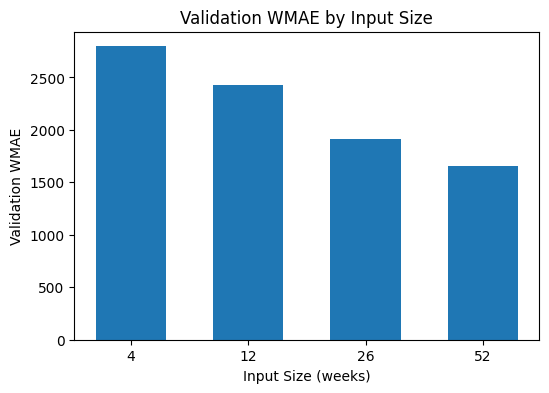

In [ ]:
# Cell 3: Bar chart in Colab comparing validation WMAE vs input_size

import matplotlib.pyplot as plt

# Unzip results
sizes, wmaes = zip(*results)

fig, ax = plt.subplots(figsize=(6,4))
ax.bar([str(s) for s in sizes], wmaes, width=0.6)
ax.set_xlabel("Input Size (weeks)")
ax.set_ylabel("Validation WMAE")
ax.set_title("Validation WMAE by Input Size")
plt.show()


# horizon

In [ ]:
# Cell 4: Sweep over horizon h with fixed input_size, max_steps, learning_rate

import wandb

# Sweep horizons to try (in weeks)
horizons = [4, 8, 16, 40]
input_size = 52
max_steps = 2000
learning_rate = 0.001

h_results = []

for h in horizons:
    print("\n" + "="*60)
    print(f"Training with horizon h = {h}")
    print("="*60)

    run = wandb.init(
        project="ML_Final",
        name=f"NBeats_h{h}",
        config={
            "input_size":     input_size,
            "h":              h,
            "max_steps":      max_steps,
            "learning_rate":  learning_rate,
            "batch_size":     64,
            "n_blocks":       [3,3,3],
            "stack_types":    ["identity","trend","seasonality"],
            "n_polynomials":  2,
            "n_harmonics":    2,
        },
        reinit=True,
        settings=wandb.Settings(_disable_stats=True)
    )

    # build & train
    model = NBEATSModel(
        input_size     = input_size,
        h              = h,
        n_blocks       = [3,3,3],
        max_steps      = max_steps,
        batch_size     = 64,
        stack_types    = ["identity","trend","seasonality"],
        n_polynomials  = 2,
        n_harmonics    = 2,
        learning_rate  = learning_rate
    )
    model.fit(X_train, y_train)

    # evaluate on validation
    val_m = evaluate_and_plot(
        model,
        X_val.assign(y=y_val),
        y_val.values,
        w_val,
        split="val"
    )
    val_wmae = val_m["WMAE"]
    h_results.append((h, val_wmae))

    # log summary metric
    wandb.log({"val_WMAE": val_wmae})
    run.finish()
    print(f"→ Done h={h}, val_WMAE={val_wmae:.2f}")



Training with horizon h = 4


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.5 M  | train
-------------------------------------------------------
7.4 M     Trainable params
1.5 K     Non-trainable params
7.5 M     Total params
29.805    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=14435.9070  MAE=14234.6867  RMSE=25593.8474  R2=-0.3436


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,14234.68668
val_R2,-0.34363
val_RMSE,25593.84738
val_WMAE,14435.90696


→ Done h=4, val_WMAE=14435.91

Training with horizon h = 8


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.5 M  | train
-------------------------------------------------------
7.5 M     Trainable params
3.1 K     Non-trainable params
7.5 M     Total params
29.935    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=13039.7083  MAE=12687.3658  RMSE=23986.1754  R2=-0.1801


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,12687.36584
val_R2,-0.18013
val_RMSE,23986.17544
val_WMAE,13039.70829


→ Done h=8, val_WMAE=13039.71

Training with horizon h = 16


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.5 M  | train
-------------------------------------------------------
7.5 M     Trainable params
6.7 K     Non-trainable params
7.5 M     Total params
30.196    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=10315.3525  MAE=9668.1304  RMSE=20556.7280  R2=0.1332


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,9668.13044
val_R2,0.13321
val_RMSE,20556.72798
val_WMAE,10315.35252


→ Done h=16, val_WMAE=10315.35

Training with horizon h = 40


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.7 M  | train
-------------------------------------------------------
7.7 M     Trainable params
22.4 K    Non-trainable params
7.7 M     Total params
30.997    Total estimated model params size (MB)
85        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[VAL] WMAE=1657.1650  MAE=1644.6594  RMSE=3643.4370  R2=0.9728


val_MAE,▁
val_R2,▁
val_RMSE,▁
val_WMAE,▁▁
val_MAE,1644.65936
val_R2,0.97277
val_RMSE,3643.43699
val_WMAE,1657.16501


→ Done h=40, val_WMAE=1657.17


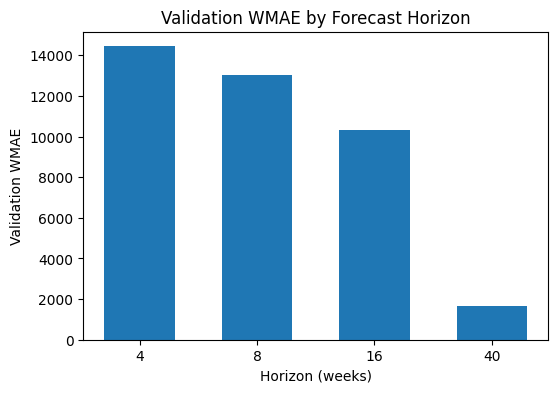

In [ ]:
# Cell 5: Bar chart in Colab comparing Validation WMAE vs horizon h

import matplotlib.pyplot as plt

hs, wmaes_h = zip(*h_results)

fig, ax = plt.subplots(figsize=(6,4))
ax.bar([str(h) for h in hs], wmaes_h, width=0.6)
ax.set_xlabel("Horizon (weeks)")
ax.set_ylabel("Validation WMAE")
ax.set_title("Validation WMAE by Forecast Horizon")
plt.show()
